# import package

In [3]:
import os
os.environ['USE_PYGEOS'] = '0'
import networkx
# import osmnx
import random
import numpy as np
import osmnx as ox
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from geopandas import GeoDataFrame
import glob
import spaghetti
from pyproj import Proj, transform
import pyproj
from shapely.geometry import Point, LineString
import geopandas as gpd
from shapely.geometry import Polygon

from libpysal.cg.voronoi import voronoi, voronoi_frames
# voronoi weights
from libpysal.weights.contiguity import Voronoi as Vornoi_weights
# voronoi plot
from scipy.spatial import Voronoi, voronoi_plot_2d
# voronoi streetmap visualization
import smopy

# spatial delaunay and visualization
from scipy.spatial import Delaunay, delaunay_plot_2d
import matplotlib.tri as mpltri
import math

# Calculate the closest distance
from shapely.ops import nearest_points

D:\programmingKing\Anaconda\envs\ui_env\lib\site-packages\spaghetti\network.py:39: FutureWarning: The next major release of pysal/spaghetti (2.0.0) will drop support for all ``libpysal.cg`` geometries. This change is a first step in refactoring ``spaghetti`` that is expected to result in dramatically reduced runtimes for network instantiation and operations. Users currently requiring network and point pattern input as ``libpysal.cg`` geometries should prepare for this simply by converting to ``shapely`` geometries.
  warnings.warn(f"{dep_msg}", FutureWarning)


## Before analysis Data Process

In [4]:
# Locate all data.csv in the folder
CRIMES_DIR = "D://Pg-urban informatics//nteworkanalysis//cw2data//utf-8"
# We will only use the longitude and latitude columns in the data
USE_COLS = ['Easting', 'Northing','Casualty Class','Accident Date','Road Surface','Weather Conditions']

# We need to load and collate all CSV files into a single dataframe
months_df = [pd.read_csv(csv_file, usecols=USE_COLS) \
                for path, subdir, _ in os.walk(CRIMES_DIR) \
                 for csv_file in glob.glob(os.path.join(path, "*.csv"))]

print("Found {} CSV files in {}".format(len(months_df), CRIMES_DIR))

crimes_df = pd.concat(months_df, axis=0, ignore_index=True)
print("Total no. of crimes loaded: {}".format(len(crimes_df)))

Found 11 CSV files in D://Pg-urban informatics//nteworkanalysis//cw2data//utf-8
Total no. of crimes loaded: 27540


In [5]:
# Filter out 'Easting', 'Northing' coordinates are not null, and 'Casualty Class' is 'Driver/Rider' points
located_crimes = crimes_df.dropna(subset=['Easting', 'Northing'])
print("Total no. of located crimes filtered: {}".format(len(located_crimes)))  

Total no. of located crimes filtered: 27540


In [6]:
#Normalize this type of data
located_crimes['Casualty Class']='Driver'
#projection conversion
# Define the British National Grid projection
bng = Proj(init='epsg:27700')
# Define WGS84 latitude and longitude projection
wgs84 = Proj(init='epsg:4326')
located_crimes['Northing'] = pd.to_numeric(located_crimes['Northing'], errors='coerce')
located_crimes['Easting'] = pd.to_numeric(located_crimes['Easting'], errors='coerce')
located_crimes.dropna(inplace=True)
#Convert 84 to 27700 latitude and longitude
easting = np.array(located_crimes['Easting'])
northing = np.array(located_crimes['Northing'])
lon, lat = transform(bng, wgs84, easting, northing)
located_crimes['Longitude'] = lon
located_crimes['Latitude'] = lat
located_crimes
located_crimes.to_csv('D://Pg-urban informatics//nteworkanalysis//cw2data//output.csv', index=False)

D:\programmingKing\Anaconda\envs\ui_env\lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
D:\programmingKing\Anaconda\envs\ui_env\lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\Songchen Yao\AppData\Local\Temp\ipykernel_31904\3225068939.py:14: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-

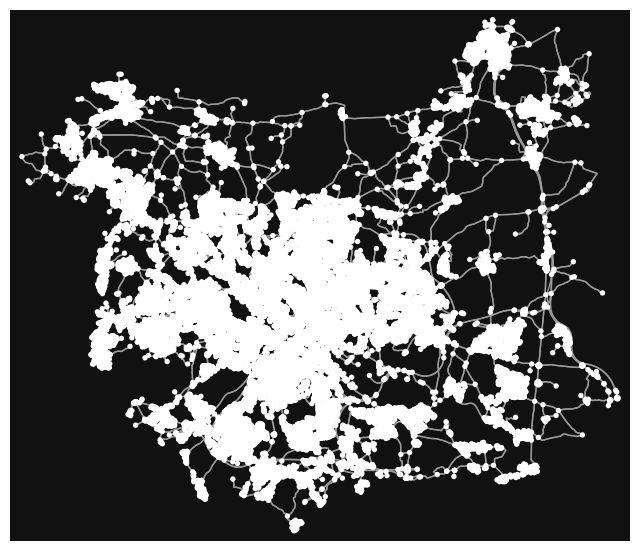

(<Figure size 800x800 with 1 Axes>, <AxesSubplot: >)

In [7]:
#Picture of the whole Leeds
# Choose a place whose crimes we will analyse with respect to its street network
PLACE_OF_INTEREST_whole = "Leeds, United Kingdom"
# Get the geographical area of Soho from OpenStreetMap as a GeoDataFrame
Leeds_area_whole = ox.geocode_to_gdf(PLACE_OF_INTEREST_whole, buffer_dist=564)
Leeds_polygon_whole = Leeds_area_whole['geometry'][0]
Leeds_graph_whole = ox.graph_from_place(PLACE_OF_INTEREST_whole, buffer_dist=564,network_type='drive')
Leeds_area_whole = ox.project_gdf(Leeds_area_whole).unary_union.area
ox.plot_graph(Leeds_graph_whole)

In [8]:
# Translate to a GeoDatFrame where the geometry is given by a Point constructed from the longitude and latitude
crime_points_whole = GeoDataFrame(geometry=[Point(xy) for xy in zip(
    located_crimes.Longitude, located_crimes.Latitude)])

# Combine crime information and city information to analyze, and output crime information in the specified polygon
Leeds_crimes_whole = crime_points_whole[crime_points_whole.geometry.within(Leeds_polygon_whole)]

In [9]:
# Geographic information of points
x_values_whole = nx.get_node_attributes(Leeds_graph_whole, 'x')
y_values_whole = nx.get_node_attributes(Leeds_graph_whole, 'y')

# Edge information
graph_with_geometries_whole = list(Leeds_graph_whole.edges(data=True))

#Combine these information
for e in graph_with_geometries_whole:
    if not 'geometry' in e[2]:
        e[2]['geometry'] = LineString([
            Point(x_values_whole[e[0]], y_values_whole[e[0]]),
            Point(x_values_whole[e[1]], y_values_whole[e[1]])])
        
# Remove the starting point to build the Spaghetti network
road_lines_whole = [x[2] for x in graph_with_geometries_whole]

# From this, we can construct a GeoDataFrame
roads_geodataframe_whole = GeoDataFrame(pd.DataFrame(road_lines_whole))

# Task 1.1 Basic information(of leeds city centre)

In [10]:
#Leeds City Centre
PLACE_OF_INTEREST = "Leeds city centre, Leeds, United Kingdom"
# Get the geographical area of Soho from OpenStreetMap as a GeoDataFrame
Leeds_area = ox.geocode_to_gdf(PLACE_OF_INTEREST, buffer_dist=480)
Leeds_polygon = Leeds_area['geometry'][0]
Leeds_graph = ox.graph_from_place(PLACE_OF_INTEREST, buffer_dist=480,network_type='drive')
Leeds_area = ox.project_gdf(Leeds_area).unary_union.area
ox.basic_stats(Leeds_graph, area=Leeds_area)

{'n': 137,
 'm': 296,
 'k_avg': 4.321167883211679,
 'edge_length_total': 20549.864999999987,
 'edge_length_avg': 69.42521959459455,
 'streets_per_node_avg': 2.883211678832117,
 'streets_per_node_counts': {0: 0, 1: 20, 2: 0, 3: 94, 4: 22, 5: 1},
 'streets_per_node_proportions': {0: 0.0,
  1: 0.145985401459854,
  2: 0.0,
  3: 0.6861313868613139,
  4: 0.16058394160583941,
  5: 0.0072992700729927005},
 'intersection_count': 117,
 'street_length_total': 12307.420000000006,
 'street_segment_count': 182,
 'street_length_avg': 67.62318681318685,
 'circuity_avg': 1.0232225546590097,
 'self_loop_proportion': 0.0,
 'node_density_km': 165.8628418011661,
 'intersection_density_km': 141.64928825355062,
 'edge_density_km': 24879.262828688454,
 'street_density_km': 14900.318660149698}

In [11]:
import osmnx as ox

# set geographic location
PLACE_OF_INTEREST_whole = "Leeds city centre, Leeds, United Kingdom"

# Get geographic data from OpenStreetMap and create a GeoDataFrame object
Leeds_area = ox.geocode_to_gdf(PLACE_OF_INTEREST_whole, buffer_dist=564)
Leeds_area_proj = Leeds_area.to_crs(epsg=27700)

# Calculate the coordinates of the center point of the GeoDataFrame
centroid = Leeds_area_proj.centroid.iloc[0]

# Print the coordinates of the center point
print(centroid)

import pyproj

bng = pyproj.Proj("EPSG:27700") # UK National Grid Reference System
wgs84 = pyproj.Proj("EPSG:4326") # WGS84 reference system

# Convert UK National Grid coordinates to latitude and longitude coordinates
lon, lat = pyproj.transform(bng, wgs84, 431032.379436662,434858.31726959173)

# print latitude and longitude coordinates
print("Centre point：({:.6f}, {:.6f})".format(lat, lon))

POINT (431032.379436662 434858.31726959173)
Centre point：(-1.530233, 53.809111)


C:\Users\Songchen Yao\AppData\Local\Temp\ipykernel_31904\2450991798.py:22: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, lat = pyproj.transform(bng, wgs84, 431032.379436662,434858.31726959173)


# Task eficiency and diameter(circuit in last part) 

In [12]:
#Analyze the diatmeter in the network
# Find the diameter of the largest component
longest_path = max(nx.strongly_connected_components(Leeds_graph), key=len)
x = Leeds_graph.subgraph(longest_path)
print(nx.diameter(x))

29


In [13]:
Leeds_intersection_graph = Leeds_graph.copy()
# for i_key,i_value in Leeds_intersection_graph.nodes.items().copy():
#     if i_value['street_count']<3:
#         del Leeds_intersection_graph[i_key]
to_remove = [n for n, d in Leeds_intersection_graph.nodes(data=True) if d['street_count'] < 3]
Leeds_intersection_graph.remove_nodes_from(to_remove)
len(Leeds_intersection_graph)

117

In [14]:
print(Leeds_polygon.area)

0.00011271844047215684


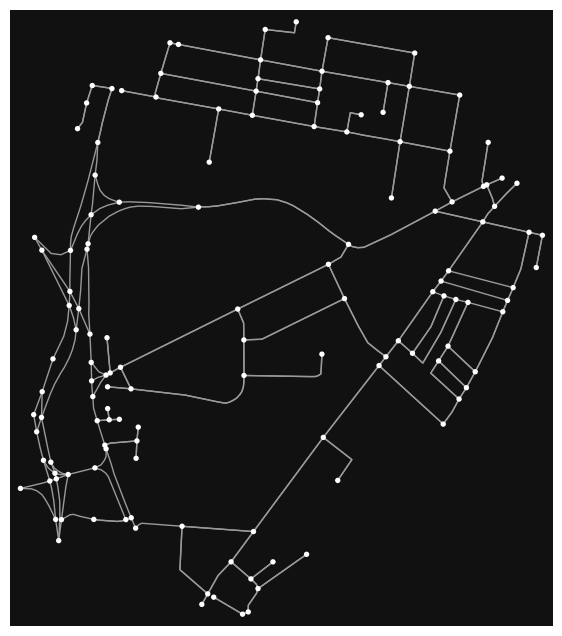

(<Figure size 800x800 with 1 Axes>, <AxesSubplot: >)

In [15]:
# draw the network
ox.plot_graph(Leeds_graph)

# planarity

In [16]:
# check planarity
is_planar, kuratowski_subgraphs = nx.check_planarity(Leeds_graph, counterexample=True)
print(is_planar)

True


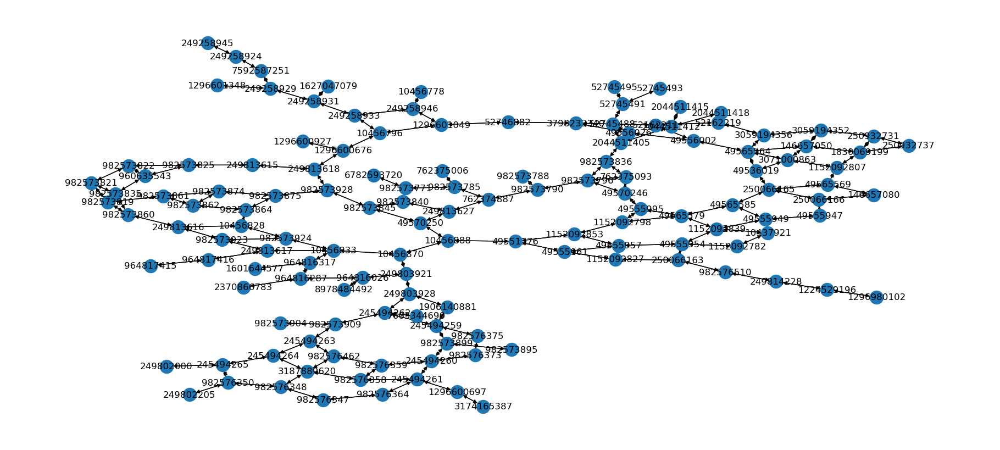

<Figure size 640x480 with 0 Axes>

In [17]:
# draw node distribution map
plt.figure(figsize=(18, 8))
nx.draw(kuratowski_subgraphs, pos=nx.kamada_kawai_layout(kuratowski_subgraphs), arrows=True, arrowstyle='-|>', with_labels=True)
plt.show()
plt.savefig('myplot.pdf', format='pdf')
plt.savefig('D:/Pg-urban informatics/nteworkanalysis/myplot.png', dpi=300)

# accidents parttern visulization

In [18]:
# Translate to a GeoDatFrame where the geometry is given by a Point constructed from the longitude and latitude
crime_points = GeoDataFrame(geometry=[Point(xy) for xy in zip(
    located_crimes.Longitude, located_crimes.Latitude)])

print("Total no. of located crimes filtered: {}".format(len(crime_points)))

# Combine crime information and city information to analyze, and output crime information in the specified polygon
Leeds_crimes = crime_points[crime_points.geometry.within(Leeds_polygon)]

Total no. of located crimes filtered: 24875


In [19]:
# Geographic information of points
x_values = nx.get_node_attributes(Leeds_graph, 'x')
y_values = nx.get_node_attributes(Leeds_graph, 'y')

# Edge information of the point
graph_with_geometries = list(Leeds_graph.edges(data=True))

#Combine these information
for e in graph_with_geometries:
    if not 'geometry' in e[2]:
        e[2]['geometry'] = LineString([
            Point(x_values[e[0]], y_values[e[0]]),
            Point(x_values[e[1]], y_values[e[1]])])
        
# Remove the starting point to build the Spaghetti network
road_lines = [x[2] for x in graph_with_geometries]

# From this, we can construct a GeoDataFrame
roads_geodataframe = GeoDataFrame(pd.DataFrame(road_lines))

<AxesSubplot: >

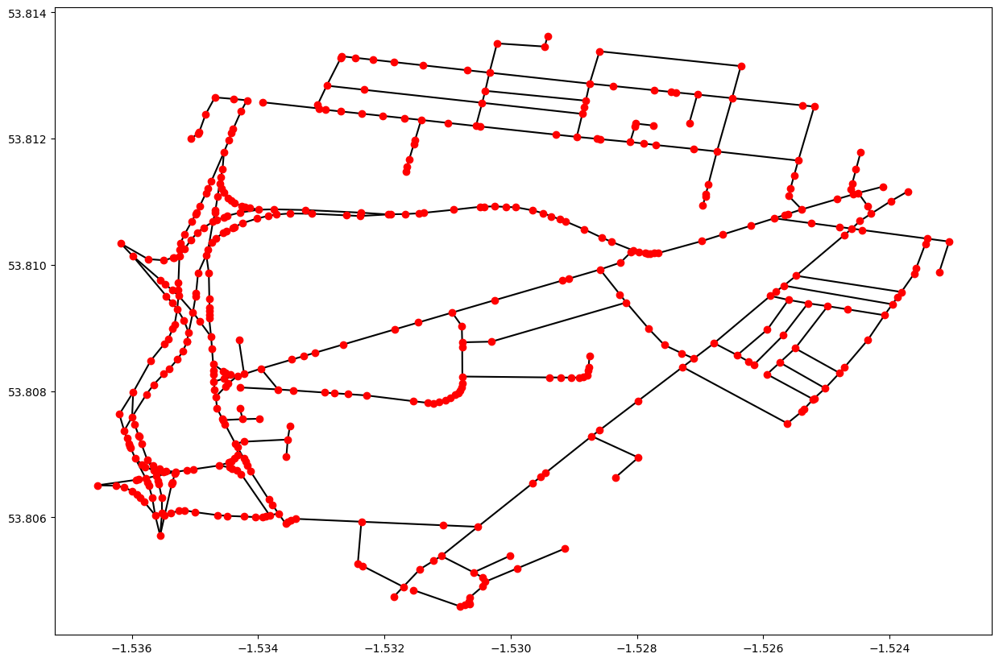

In [20]:
# From the GeoDataFrame, we can construct a network in Spaghetti from which to do point analysis
Leeds_points_graph = spaghetti.Network(in_data=roads_geodataframe)


# Check what this new network looks like by getting DataFrames for the edges and plotting them
nodes_df, edges_df = spaghetti.element_as_gdf(
    Leeds_points_graph, vertices=True, arcs=True)

# draw the road network
base_network = edges_df.plot(color = "k", zorder=0, figsize=(15, 15))
nodes_df.plot(ax=base_network, color="r", zorder=2)

D:\programmingKing\Anaconda\envs\ui_env\lib\site-packages\libpysal\cg\shapes.py:103: FutureWarning: Objects based on the `Geometry` class will deprecated and removed in a future version of libpysal.
  warnings.warn(dep_msg, FutureWarning)
D:\programmingKing\Anaconda\envs\ui_env\lib\site-packages\libpysal\cg\shapes.py:1006: FutureWarning: Objects based on the `Geometry` class will deprecated and removed in a future version of libpysal.
  warnings.warn(dep_msg, FutureWarning)
D:\programmingKing\Anaconda\envs\ui_env\lib\site-packages\libpysal\cg\shapes.py:1923: FutureWarning: Objects based on the `Geometry` class will deprecated and removed in a future version of libpysal.
  warnings.warn(dep_msg, FutureWarning)


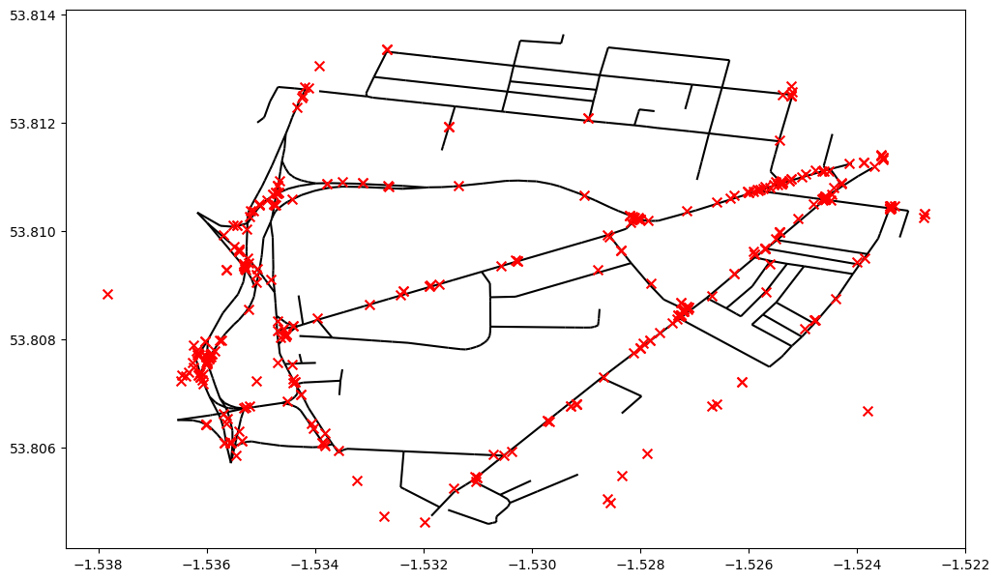

In [21]:
Leeds_points_graph.snapobservations(Leeds_crimes, 'crimes')
base_network = edges_df.plot(color="k", zorder=0, figsize =(12, 12))
Leeds_crimes.plot(
    color="r", marker="x",
    markersize=50, zorder=1, ax=base_network)

plt.show()

observation 1
true coords:	(-1.5233903337570847, 53.81042073771866)
snapped coords:	(-1.523391175488673, 53.81041440180877)


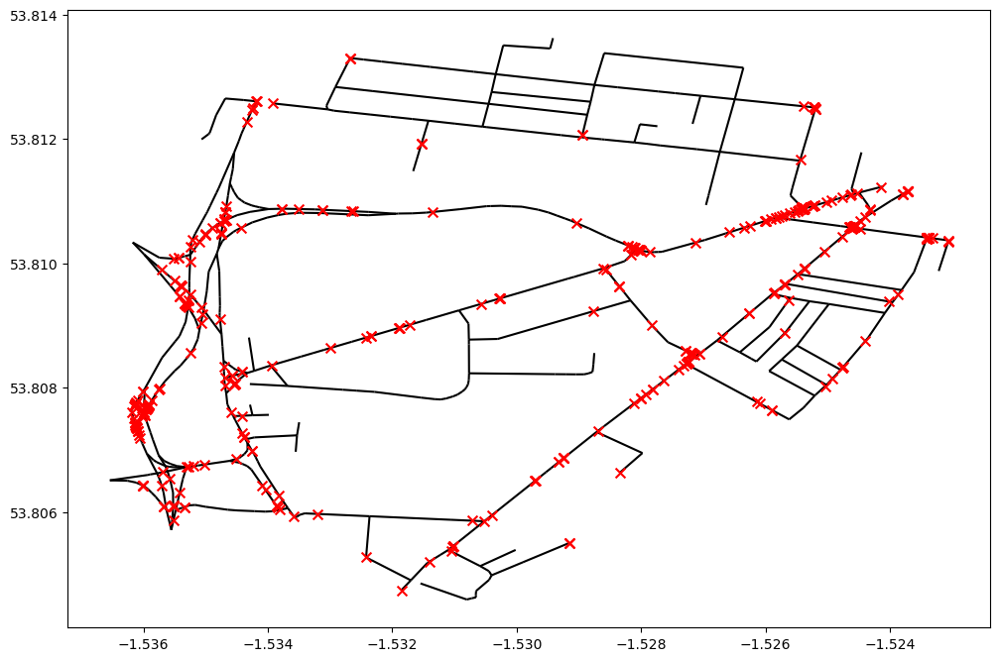

In [22]:
# Locate road crashes on the nearest street
Leeds_points_graph.snapobservations(Leeds_crimes, 'crimes')

# We can see the difference between the original crime coordinates and their position when snapped to the road network
print("observation 1\ntrue coords:\t%s\nsnapped coords:\t%s" % (
    Leeds_points_graph.pointpatterns["crimes"].points[0]["coordinates"],
    Leeds_points_graph.pointpatterns["crimes"].snapped_coordinates[0]
))

# Show the network
base_network = edges_df.plot(color="k", zorder=0, figsize =(12, 12))

# Get a GeoDataFrame of the snapped crime locations to plot on the network image
snapped_crimes=spaghetti.element_as_gdf(
    Leeds_points_graph, pp_name='crimes', snapped=True)
snapped_crimes

# Plot these on the road network
snapped_crimes.plot(
    color="r", marker="x",
    markersize=50, zorder=1, ax=base_network)

plt.show()

# relation between accidents parttern and road connectity

In [23]:
# Ps: you should already have esda in your env; if not, just run:
#!conda install -c conda-forge esda
import esda

In [24]:
kres = Leeds_points_graph.GlobalAutoK(
    Leeds_points_graph.pointpatterns["crimes"],
    nsteps=50, permutations=100
)

In [25]:
kres.lam
kres.xaxis
kres.observed
kres.upperenvelope
kres.lowerenvelope
kres.sim

print(f"Density of points in the network (lambda): {kres.lam}")

Density of points in the network (lambda): 3088.1431312916015


In [26]:
print(f"Distances at which density is measured:\n{kres.xaxis}")

Distances at which density is measured:
[0.         0.00046849 0.00093698 0.00140547 0.00187396 0.00234245
 0.00281094 0.00327943 0.00374793 0.00421642 0.00468491 0.0051534
 0.00562189 0.00609038 0.00655887 0.00702736 0.00749585 0.00796434
 0.00843283 0.00890132 0.00936981 0.0098383  0.0103068  0.01077529
 0.01124378 0.01171227 0.01218076 0.01264925 0.01311774 0.01358623
 0.01405472 0.01452321 0.0149917  0.01546019 0.01592868 0.01639717
 0.01686567 0.01733416 0.01780265 0.01827114 0.01873963 0.01920812
 0.01967661 0.0201451  0.02061359 0.02108208 0.02155057 0.02201906
 0.02248755 0.02295604]


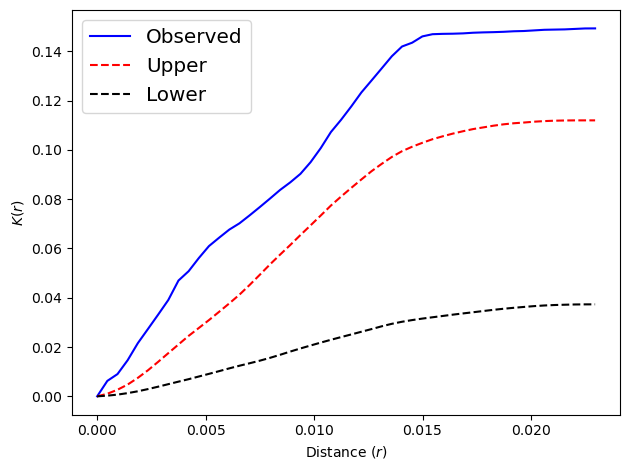

In [27]:
fig, ax = plt.subplots()

ax.plot(kres.xaxis, kres.observed, "b-", label="Observed")
ax.plot(kres.xaxis, kres.upperenvelope, "r--", label="Upper")
ax.plot(kres.xaxis, kres.lowerenvelope, "k--", label="Lower")

ax.legend(loc="best", fontsize="x-large")
ax.set_xlabel("Distance $(r)$")
ax.set_ylabel("$K(r)$")

fig.tight_layout()

In [28]:
# Get snapped point pattern 
pointpat = Leeds_points_graph.pointpatterns['crimes']
# Get count of points per network edge: a dictionary from each edge to the crime count on that edge
counts = Leeds_points_graph.count_per_link(pointpat.obs_to_arc, graph=False)
sorted_count = sorted(counts.items(), key=lambda x:x[1],reverse=True)

In [29]:
# Get the weights matrix for edges in the graph (just the adjacency matrix with 1 where edges connect at a node, 0 otherwise)
weights = Leeds_points_graph.w_network

In [30]:
# Get the edges included in the weights matrix: an enumerator for a list of edges
edges = weights.neighbors.keys()
# Construct an array of the counts values per edge in the same order as
# the weights matrix, with 0.0 where no counts recorded
values = [counts[edge] if edge in counts.keys () else 0. \
    for index, edge in enumerate(edges)]

In [31]:
for i in weights:
    print(i)

((0, 1), {(0, 5): 1.0, (0, 390): 1.0, (1, 2): 1.0})
((0, 5), {(0, 1): 1.0, (0, 390): 1.0, (5, 6): 1.0})
((0, 390), {(0, 1): 1.0, (0, 5): 1.0, (390, 391): 1.0})
((1, 2), {(0, 1): 1.0, (2, 3): 1.0})
((2, 3), {(1, 2): 1.0, (3, 4): 1.0})
((3, 4), {(2, 3): 1.0, (4, 7): 1.0, (4, 148): 1.0, (4, 421): 1.0})
((4, 7), {(3, 4): 1.0, (4, 148): 1.0, (4, 421): 1.0, (6, 7): 1.0, (7, 92): 1.0, (7, 93): 1.0})
((4, 148), {(3, 4): 1.0, (4, 7): 1.0, (4, 421): 1.0, (94, 148): 1.0, (148, 149): 1.0, (148, 398): 1.0})
((4, 421), {(3, 4): 1.0, (4, 7): 1.0, (4, 148): 1.0, (421, 422): 1.0})
((5, 6), {(0, 5): 1.0, (6, 7): 1.0})
((6, 7), {(4, 7): 1.0, (5, 6): 1.0, (7, 92): 1.0, (7, 93): 1.0})
((7, 92), {(4, 7): 1.0, (6, 7): 1.0, (7, 93): 1.0, (91, 92): 1.0})
((7, 93), {(4, 7): 1.0, (6, 7): 1.0, (7, 92): 1.0, (93, 94): 1.0})
((8, 9), {(9, 254): 1.0, (9, 255): 1.0})
((9, 254), {(8, 9): 1.0, (9, 255): 1.0, (253, 254): 1.0})
((9, 255), {(8, 9): 1.0, (9, 254): 1.0, (255, 256): 1.0})
((10, 11), {(10, 12): 1.0, (10, 16):

In [32]:
moran = esda.moran.Moran(values, weights)
print(moran.I)

0.2668500595586587


In [33]:
print(moran.EI)

-0.002004008016032064


In [34]:
moran, y_crime = Leeds_points_graph.Moran('crimes',graph=True)
print(moran.I)

0.3647911561668379


In [35]:
print(moran.EI)

-0.006211180124223602


In [36]:
print(moran.p_sim)

0.001


In [37]:
print(moran.EI)
print(moran.EI_sim)

-0.006211180124223602
-0.007550263313477025


Text(0.5, 0, "Moran's I")

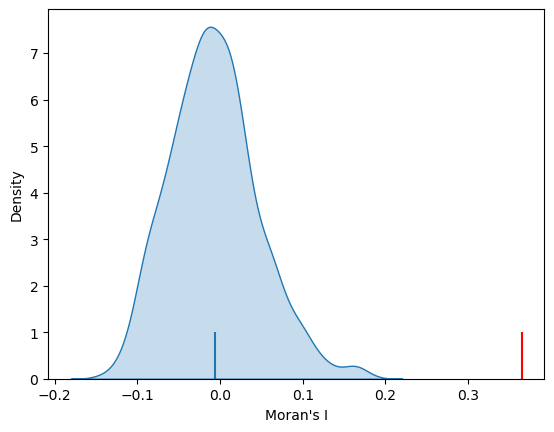

In [38]:
import seaborn as sns

sns.kdeplot(moran.sim, shade=True)
plt.vlines(moran.I, 0, 1, color='r')
plt.vlines(moran.EI, 0,1)
plt.xlabel("Moran's I") 

In [39]:
print(moran.z_norm)
print(moran.z_sim)

6.677050921076609
6.971834254248166


# relationship between accidents parttern and road intersection

In [40]:
#Distinguish the difference between Leeds_intersection and Leeds_nodes, and process Leeds_intersection_graph separately
# Geographic information of points
x_values = nx.get_node_attributes(Leeds_intersection_graph, 'x')
y_values = nx.get_node_attributes(Leeds_intersection_graph, 'y')

# Edge information of the point
graph_with_geometries = list(Leeds_intersection_graph.edges(data=True))

#Combine these information
for e in graph_with_geometries:
    if not 'geometry' in e[2]:
        e[2]['geometry'] = LineString([
            Point(x_values[e[0]], y_values[e[0]]),
            Point(x_values[e[1]], y_values[e[1]])])
        
# Remove the starting point to build the Spaghetti network
road_lines = [x[2] for x in graph_with_geometries]

# From this, we can construct a GeoDataFrame
roads_intersection_geodataframe = GeoDataFrame(pd.DataFrame(road_lines))
roads_intersection_geodataframe

# From the GeoDataFrame, we can construct a network in Spaghetti from which to do point analysis
Leeds_intersection_points_graph = spaghetti.Network(in_data=roads_intersection_geodataframe)


# Check what this new network looks like by getting DataFrames for the edges and plotting them
nodes_intersection_df, edges_intersection_df = spaghetti.element_as_gdf(
    Leeds_intersection_points_graph, vertices=True, arcs=True)


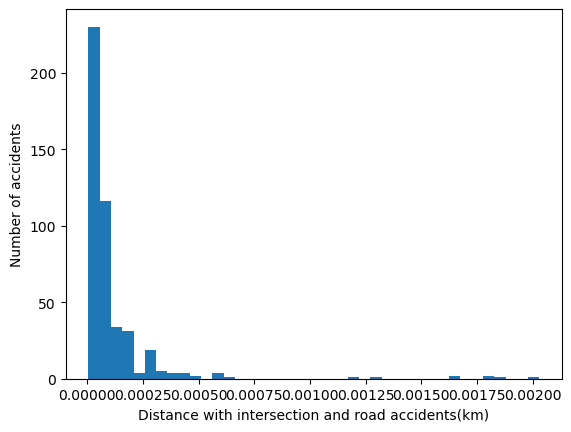

In [41]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
test_plot = []
# traverse all nodes
for i in Leeds_crimes["geometry"]:
    nearest_node = nodes_intersection_df["geometry"].distance(i).idxmin()
    distance = nodes_intersection_df.loc[nearest_node,"geometry"].distance(i)
    test_plot.append(distance)

# draw the histogram
plt.hist(test_plot, bins=40)
plt.xlabel("Distance with intersection and road accidents(km)")
plt.ylabel("Number of accidents")
plt.show()

# seeds selection and voronoi visualization

In [42]:
#take place splatti
from shapely.geometry import Point
import geopandas as gpd
import pandas as pd
import osmnx as ox

# Get the graphic data of the Leeds road network
PLACE_OF_INTEREST_whole = "Leeds, United Kingdom"
Leeds_area_whole = ox.graph_from_place(PLACE_OF_INTEREST_whole, network_type='drive')

# Create a DataFrame with information about each node
leeds_nodes_df = pd.DataFrame(columns=['x', 'y'])
for node, data in Leeds_area_whole.nodes(data=True):
    leeds_nodes_df = leeds_nodes_df.append({'x': data['x'], 'y': data['y']}, ignore_index=True)

# Convert the x and y columns to Shapely Point objects and create a new geometry column
leeds_nodes_df['geometry'] = gpd.GeoSeries.from_xy(leeds_nodes_df['x'], leeds_nodes_df['y']).apply(Point)

C:\Users\Songchen Yao\AppData\Local\Temp\ipykernel_31904\513581995.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  leeds_nodes_df = leeds_nodes_df.append({'x': data['x'], 'y': data['y']}, ignore_index=True)
C:\Users\Songchen Yao\AppData\Local\Temp\ipykernel_31904\513581995.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  leeds_nodes_df = leeds_nodes_df.append({'x': data['x'], 'y': data['y']}, ignore_index=True)
C:\Users\Songchen Yao\AppData\Local\Temp\ipykernel_31904\513581995.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  leeds_nodes_df = leeds_nodes_df.append({'x': data['x'], 'y': data['y']}, ignore_index=True)
C:\Users\Songchen Yao\AppData\Local\Temp\ipykernel_31904\513581995.py:14: FutureWarning: The fram

In [43]:
# select the required columns
node_df_whole = leeds_nodes_df[['geometry']]
node_df_whole = node_df_whole.drop_duplicates()

In [222]:
import random
from shapely.ops import nearest_points
seeds_temp = []
seeds_clean = []
seeds = []
# Loop 10 times
for i in range(10):
    # 200 randomly selected points
    random_nodes = node_df_whole.sample(n=30)
    # Calculate the distance from each random point to the nearest traffic 
    # accident point and add the distance as a new column to random_nodes
    distances = []
    for _, node in random_nodes.iterrows():
        temp_point = nearest_points(node['geometry'], snapped_crimes['geometry'].unary_union)[1]
        distance = node['geometry'].distance(temp_point)
        distances.append(distance)
    random_nodes['distance_to_crime'] = distances
    
    #index for finding the median
    random_nodes = random_nodes.sort_values('distance_to_crime')
    min_node = random_nodes.iloc[15] 
    seeds_temp.append(min_node['geometry'].xy)
    node_df_whole = node_df_whole.drop(node_df_whole[node_df_whole['geometry'] == min_node[1]].index, axis=0)

    
#Output node coordinates into seeds_clean
for items in seeds_temp:
    seeds_clean.append([items[1][0],items[0][0]])

# Loop through each seed coordinate
for seed in seeds_clean:
   # Convert coordinates to tuples
    seed = tuple(seed)

    # Check if the seed coordinates are in the node list of Leeds_area_whole
    # If the point is on the map, return the corresponding node ID
    if (seed[0], seed[1]) in Leeds_area_whole.nodes():
        node_id = Leeds_area_whole.nodes[(seed[0], seed[1])]['osmid']
        dist = 0
    else:
        # find the closest node
        closest, dist = ox.nearest_nodes(Leeds_area_whole, seed[1], seed[0], return_dist=True)
        node_id = closest
    seeds.append(node_id)

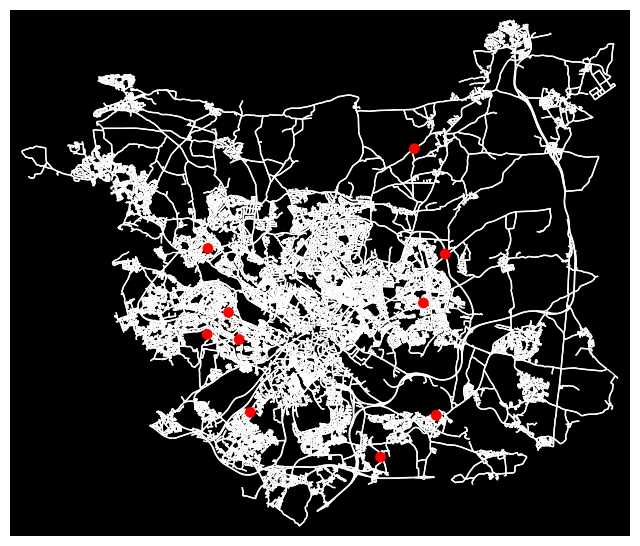

(<Figure size 800x800 with 1 Axes>, <AxesSubplot: >)

In [223]:
# draw the image of the seed
all_nodes = list(Leeds_area_whole.nodes)
node_colors = ['r' if node in seeds else 'w' for node in all_nodes]
node_size = [60 if node in seeds else 0 for node in all_nodes]
ox.plot.plot_graph(Leeds_area_whole,node_size=node_size , node_color=node_colors, edge_color='w',bgcolor ='k', save=True, filepath='nvd.png')

D:\programmingKing\Anaconda\envs\ui_env\lib\site-packages\numpy\core\fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = getattr(asarray(obj), method)(*args, **kwds)


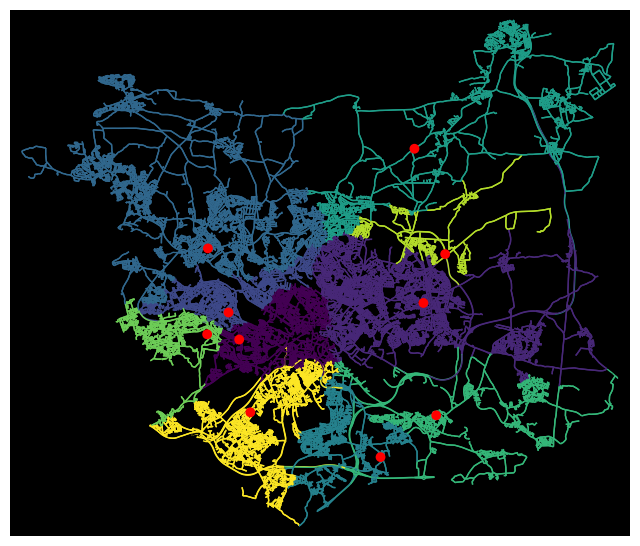

(<Figure size 800x800 with 1 Axes>, <AxesSubplot: >)

In [224]:
NUMBER_OF_SEEDS = 10

all_nodes = list(Leeds_area_whole.nodes)
distances_seeds = {seed: networkx.single_source_dijkstra_path_length(
    Leeds_area_whole, seed, weight='length') for seed in seeds}

def nearest_from_list(node_distances):
    return sorted(node_distances, key=lambda node_length: node_length[1])[0] \
        if len(node_distances) > 0 else None

def nearest_seed(node):
    seed_distances = [(seed, distances_seeds[seed][node]) \
        for seed in seeds if node in distances_seeds[seed]]
    return nearest_from_list(seed_distances)

def nearest_for_edge(edge):
    nearest_to_ends_all = [nearest_seed(edge[0]), nearest_seed(edge[1])]
    nearest_to_ends = [distance for distance in nearest_to_ends_all if distance]
    return nearest_from_list(nearest_to_ends)

colours = ox.plot.get_colors(NUMBER_OF_SEEDS)

def colour_for_seed_distance(seed):
    return colours[seeds.index(seed[0])]

edge_nearest_seeds = [nearest_for_edge(edge) for edge in Leeds_area_whole.edges]
# Note that edges not connected to a seed shown in black, so invisible on black background
edge_colours = [colour_for_seed_distance(seed) if seed else 'k' for seed in edge_nearest_seeds]
# For the road network nodes, we want the seeds to be coloured red and the non-seed nodes to be coloured white.
node_colours = ['r' if node in seeds else 'w' for node in all_nodes]
node_size = [50 if node in seeds else 0 for node in all_nodes]
ox.plot.plot_graph(Leeds_area_whole, edge_color = edge_colours, node_size=node_size,node_color = node_colours, bgcolor = 'k', save = True, filepath = 'nvd.png')

In [225]:
cells = nx.voronoi_cells(Leeds_area_whole, seeds, weight='length')

# marathon path search

this is area: 21310041
The total length of marathon route is:42084.16699999997
There do have marathon cycle


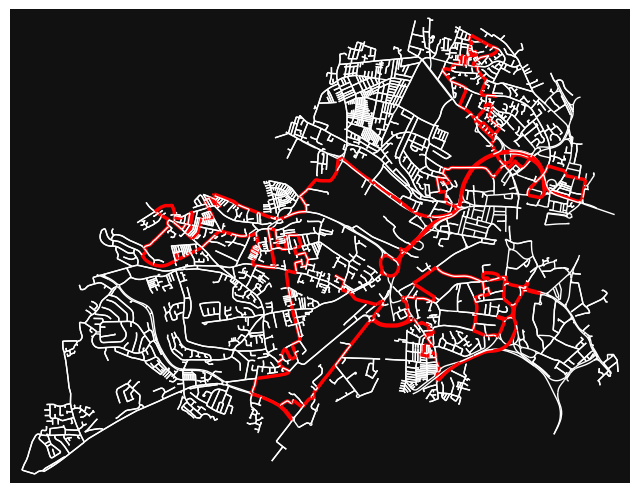

this is area: 938315800
The total length of marathon route is:43234.89500000005
There do have marathon cycle


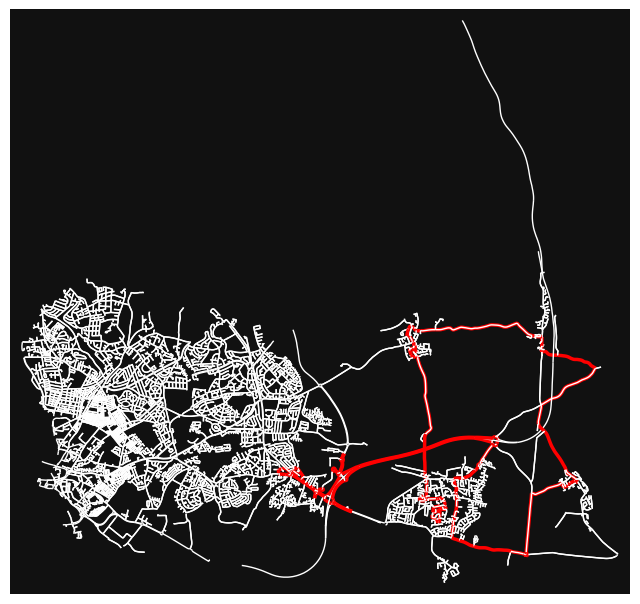

this is area: 302683986
There is no circles in this area
this is area: 1080047585
The total length of marathon route is:47198.68800000001
There do have marathon cycle


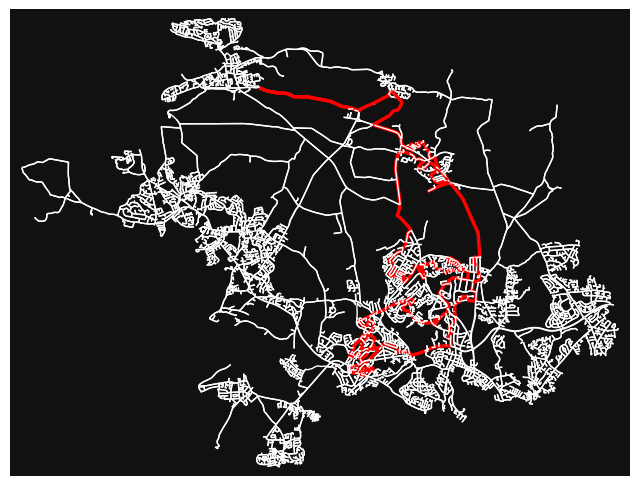

this is area: 4897285085
There is no circles in this area
this is area: 935615348
The total length of marathon route is:42356.882
There do have marathon cycle


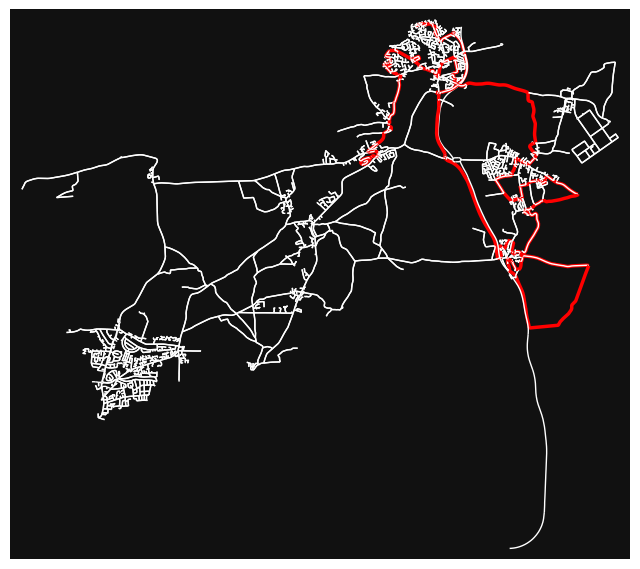

this is area: 370074784
The total length of marathon route is:49205.35799999998
There do have marathon cycle


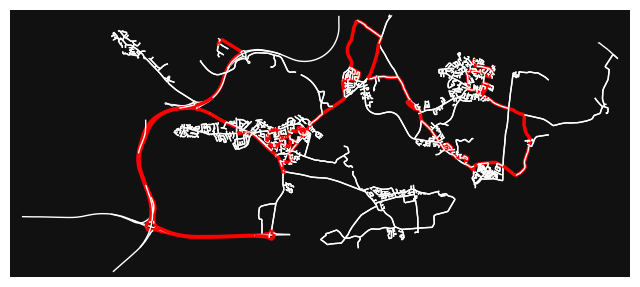

this is area: 429367181
There is no circles in this area
this is area: 8511872727
There is no circles in this area
this is area: 249231865
The total length of marathon route is:42349.204000000005
There do have marathon cycle


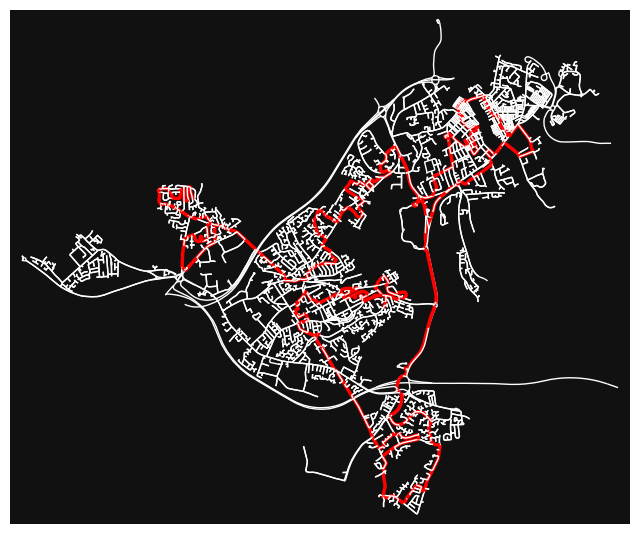

this is area: unreachable
There is no circles in this area


In [237]:
#Marathon path search begain(Prototype)
def marathon_path_search(subgraph, node, have_done_intersection, marathon_path, length):
    have_done_intersection.add(node)
    for neighbor in subgraph.successors(node):
        if neighbor in have_done_intersection:
            if length + subgraph[node][neighbor][0]['length'] >= 42000:
                marathon_path.add((node, neighbor))
                length = length + subgraph[node][neighbor][0]['length']
                x = length + subgraph[node][neighbor][0]['length']
                print('The total length of marathon route is:{}'.format(x))
                return True
        else:
            marathon_path.add((node, neighbor))
            if marathon_path_search(subgraph, neighbor, have_done_intersection, marathon_path,length + subgraph[node][neighbor][0]['length']):
                return True
            marathon_path.remove((node, neighbor))
    return False


def path_itera(subgraph):
    for node in subgraph.nodes:
        have_done_intersection = set()
        marathon_path = set()
        length = 0
        if marathon_path_search(subgraph, node, have_done_intersection, marathon_path, length):
            return marathon_path
    return None


cycle_x = set()
for key in cells:
    subgraph = Leeds_area_whole.subgraph(list(cells[key]))
    print('this is area:', format(key))
    # find cycle
    cycle = path_itera(subgraph)
    if cycle == None:
        print('There is no circles in this area')
    else:
        # print cells with marathon routes
        print('There do have marathon cycle')
        cycle_x.update(cycle)
        edge_colors = ['white' if edge not in cycle else 'red' for edge in subgraph.edges()]
        edge_width = [1 if edge not in cycle else 2.5 for edge in subgraph.edges()]
        fig, ax = ox.plot_graph(subgraph, node_size=0, edge_color=edge_colors, edge_linewidth=edge_width)
        plt.show()
        filename = f"figure_{key}.png"
        fig.savefig(filename)
        # Close the figure to avoid memory leaks
        plt.close(fig)

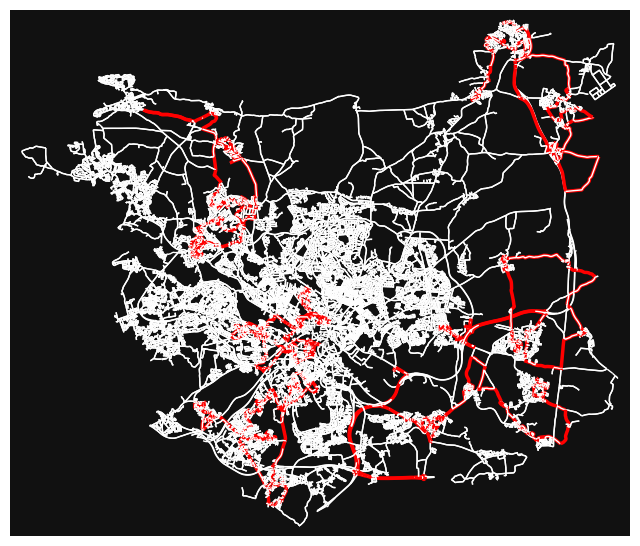

In [227]:
edge_colors = ['red' if edge in cycle_x else 'white' for edge in Leeds_area_whole.edges()]
edge_width = [1 if edge not in cycle_x  else 2.5 for edge in Leeds_area_whole.edges()]
fig, ax = ox.plot_graph(Leeds_area_whole, node_size=0, edge_color=edge_colors, edge_linewidth=edge_width)
fig.patch.set_alpha(0)
plt.show()
fig.savefig('final.png')

# marathon path improvement

In [228]:
# #Marathon path search begain(After imporvement)
# # designed but not achieve the target!!!!!!!

# cycle_set = set()
# cycles_x=[]
# for key in cells:
#     subgraph = Leeds_area_whole.subgraph(list(cells[key]))
#     print('this is area:',format(key))
# #     find cycle
#     cycle = nx.simple_cycles(subgraph)
#     result = set()
#     total=0
#     cycle_30=[]
#     for c in cycle:
#         if len(c)>5:
#             cycle_30.append(c)
#             ctemp=cycle_30[0]
#         for c in cycle_30:
#             if set(c) & set(ctemp):
#                 for i in range(len(c)):
#                     if i == len(c) - 1:
#                         result.add((c[i], c[0]))
#                         total=total+subgraph[c[i]][c[0]][0]['length']
#                     else:
#                         result.add((c[i], c[i+1]))
#                         total=total+subgraph[c[i]][c[i+1]][0]['length']
#                 c = ctemp
#         if len(result)>20:
#             cycle_set.update(result)
#             print(total)
#             break
# print(len(cycle_set))

In [229]:
cycle_set = set()
cycles_x=[]
for key in cells:
    subgraph = Leeds_area_whole.subgraph(list(cells[key]))
    print('this is area:',format(key))
    #finc cycle
    cycle = nx.simple_cycles(subgraph)
    result = set()
    for c in cycle:
        if len(c)>60:
            for i in range(len(c)):
                if i == len(c) - 1:
                    result.add((c[i], c[0]))
                else:
                    result.add((c[i], c[i+1]))
        if len(result)>=30:
            cycle_set.update(result)
            break
print(len(cycle_set))

this is area: 21310041
this is area: 938315800
this is area: 302683986
this is area: 1080047585
this is area: 4897285085
this is area: 935615348
this is area: 370074784
this is area: 429367181
this is area: 8511872727
this is area: 249231865
this is area: unreachable
1416


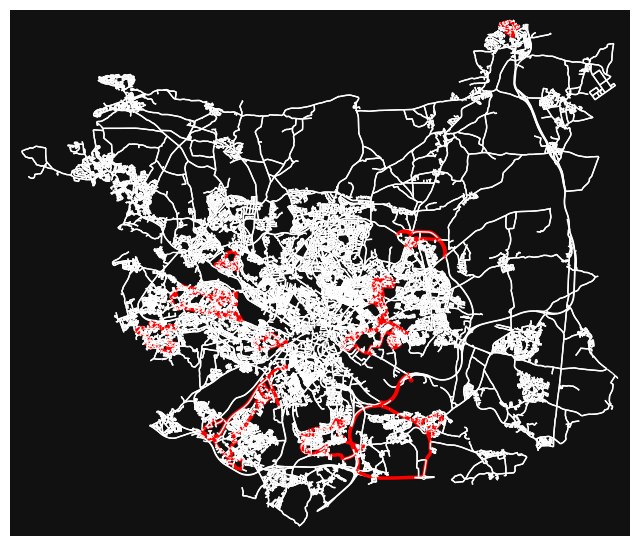

In [231]:
edge_colors = ['red' if edge in cycle_set else 'white' for edge in Leeds_area_whole.edges()]
edge_width = [1 if edge not in cycle_set else 2.5 for edge in Leeds_area_whole.edges()]
fig, ax = ox.plot_graph(Leeds_area_whole, node_size=0, edge_color=edge_colors, edge_linewidth=edge_width)
fig.patch.set_alpha(0)
plt.show()
fig.savefig('final.png')

#  PORV doc

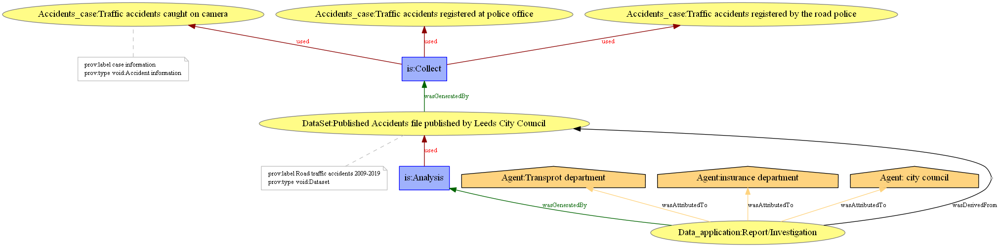

In [210]:
# PORV doc
from prov.model import ProvDocument

# Create a provenance document for traffic accidents in Leeds
Leeds_accident = ProvDocument()

# First step in data collection
# Create namespace
Leeds_accident.add_namespace('Accidents_case', 'Accidents_case from road police')
Leeds_accident.add_namespace('DataSet',
                             'https://www.data.gov.uk/dataset/6efe5505-941f-45bf-b576-4c1e09b579a1/road-traffic-accidents')
Leeds_accident.add_namespace('is', 'data collect/process and analysis')

# Create entity objects
a1 = Leeds_accident.entity('Accidents_case:Traffic accidents caught on camera',
                           {'prov:label': 'case information', 'prov:type': 'void:Accident information'})
a4 = Leeds_accident.entity('Accidents_case:Traffic accidents registered at police office')
a2 = Leeds_accident.entity('DataSet:Published Accidents file published by Leeds City Council',
                           {'prov:label': 'Road traffic accidents 2009-2019', 'prov:type': 'void:Dataset'})
a5 = Leeds_accident.entity('Accidents_case:Traffic accidents registered by the road police')
# Create activities to collect information
Leeds_accident.activity('is:Collect')
# database data obtained from the activity of collecting actions
Leeds_accident.wasGeneratedBy('DataSet:Published Accidents file published by Leeds City Council', 'is:Collect')
# Collection actions from specific incidents
Leeds_accident.used('is:Collect', 'Accidents_case:Traffic accidents caught on camera')
Leeds_accident.used('is:Collect', 'Accidents_case:Traffic accidents registered at police office')
Leeds_accident.used('is:Collect', 'Accidents_case:Traffic accidents registered by the road police')

# Second step data analysis
# Create naming of analysis results
Leeds_accident.add_namespace('Data_application', 'Report and charts links like cw2')
# Create entities for analysis results
a3 = Leeds_accident.entity('Data_application:Report/Investigation')
# of activities in the analysis process
Leeds_accident.activity('is:Analysis')
# Analysis results from analysis activities
Leeds_accident.wasGeneratedBy('Data_application:Report/Investigation', 'is:Analysis')
# Analysis results generated by database analysis
Leeds_accident.wasDerivedFrom('Data_application:Report/Investigation',
                              'DataSet:Published Accidents file published by Leeds City Council')
# Analysis activities based on database
Leeds_accident.used('is:Analysis', 'DataSet:Published Accidents file published by Leeds City Council')

# Data Applications
Leeds_accident.add_namespace('Agent', 'https://democracy.leeds.gov.uk')
Leeds_accident.agent('Agent:Transprot department')
Leeds_accident.agent('Agent:insurance department')
Leeds_accident.agent('Agent: city council')
Leeds_accident.wasAttributedTo(a3, 'Agent: city council')
Leeds_accident.wasAttributedTo(a3, 'Agent:Transprot department')
Leeds_accident.wasAttributedTo(a3, 'Agent:insurance department')

# visualize the graph
from prov.dot import prov_to_dot

dot = prov_to_dot(Leeds_accident)
dot.write_png('article-prov-activaty.png')
from IPython.display import Image

dot.write_pdf('D:/Pg-urban informatics/nteworkanalysis/cw2/article-prov.pdf')
Image('article-prov-activaty.png')

#  Pagerank

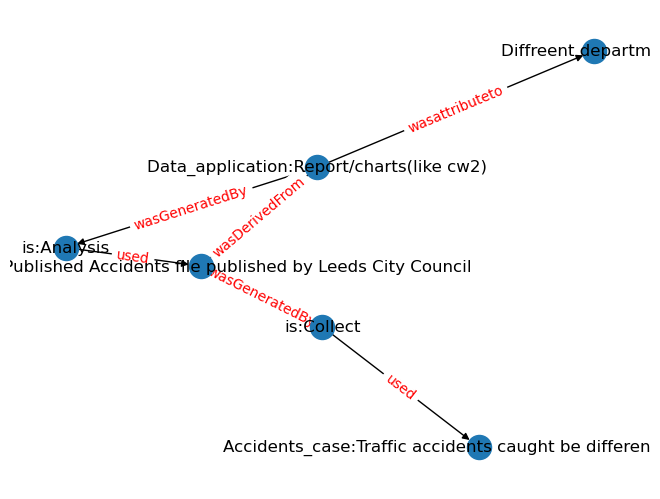

In [211]:
import networkx as nx
import matplotlib.pyplot as plt

# Create a new DiGraph
G = nx.DiGraph()

# Add nodes for entities, activities, and agents
G.add_node('DataSet:Published Accidents file published by Leeds City Council', type='entity')
G.add_node('Data_application:Report/charts(like cw2)', type='entity')
G.add_node('is:Collect', type='activity')
G.add_node('is:Analysis', type='activity')
G.add_node('Accidents_case:Traffic accidents caught be different methods', type='entity')
G.add_node('Diffreent departments', type='agent')

# Add edges to represent relations between nodes
G.add_edge('is:Collect','Accidents_case:Traffic accidents caught be different methods', label='used')
G.add_edge('DataSet:Published Accidents file published by Leeds City Council', 'is:Collect', label='wasGeneratedBy')
G.add_edge('is:Analysis','DataSet:Published Accidents file published by Leeds City Council',  label='used')
G.add_edge('Data_application:Report/charts(like cw2)', 'is:Analysis', label='wasGeneratedBy')
G.add_edge('Data_application:Report/charts(like cw2)', 'DataSet:Published Accidents file published by Leeds City Council', label='wasDerivedFrom')
G.add_edge('Data_application:Report/charts(like cw2)', 'Diffreent departments', label='wasattributeto')
# Draw the graph using matplotlib
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True)
edge_labels = {(u, v): d['label'] for u, v, d in G.edges(data=True)}
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='red')
plt.show()


In [234]:
import textwrap
def plot_pagerank(graph, pagerank):
    fig, ax = plt.subplots(1, 1, figsize=(8, 7))
    node_color = list(pagerank.values())
    node_labels = {n: '\n'.join(textwrap.wrap(n, width=15)) for n in G.nodes()}
    nx.draw(G, with_labels=True, alpha=0.8, arrows=False, node_color=node_color, cmap=plt.cm.viridis,font_size=9,labels=node_labels)
    plt.rcParams.update({'font.size': 10})
    # adding color bar for pagerank importances
    sm = plt.cm.ScalarMappable(cmap=plt.get_cmap('viridis'), norm=colors.Normalize(vmin=min(node_color), vmax=max(node_color)))
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="3%", pad=0.05)
    plt.colorbar(sm, cax=cax)

In [235]:
# Calculate PageRank score
pr_scores = nx.pagerank(G)
# Get the name of the node with the highest PageRank score
max_pr_node = max(pr_scores, key=pr_scores.get)
print(f"The most important node according to PageRank algorithm is: {max_pr_node}")

The most important node according to PageRank algorithm is: Accidents_case:Traffic accidents caught be different methods


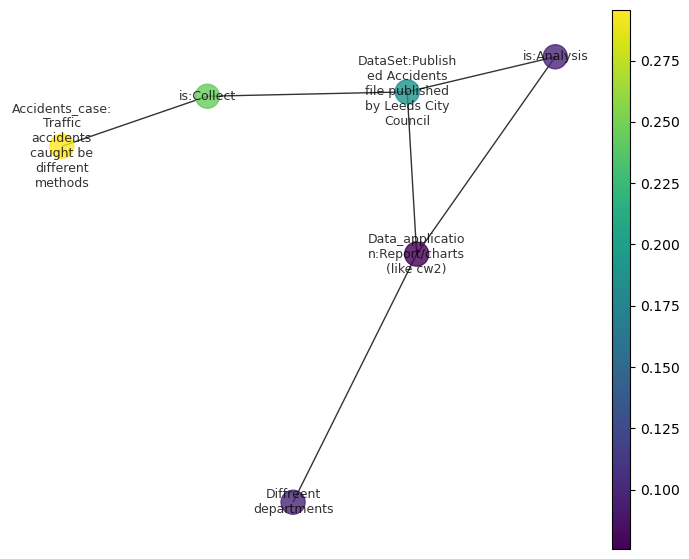

In [236]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from mpl_toolkits.axes_grid1 import make_axes_locatable
pagerank = nx.pagerank(G, alpha=0.9)
plot_pagerank(G, pagerank)